In [ ]:
import os
import zipfile
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras import Model
import matplotlib.pyplot as plt

In [ ]:
train_data_dir = r"Dataset\Train"
test_data_dir = r"Dataset\Test"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
base_dir = 'Dataset'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# Directory with our training images
train_dir = os.path.join(train_dir, 'Dataset/Train/Images')

# Directory with our validation images
validation_dogs_dir = os.path.join(validation_dir, 'Dataset/Valid/Images')

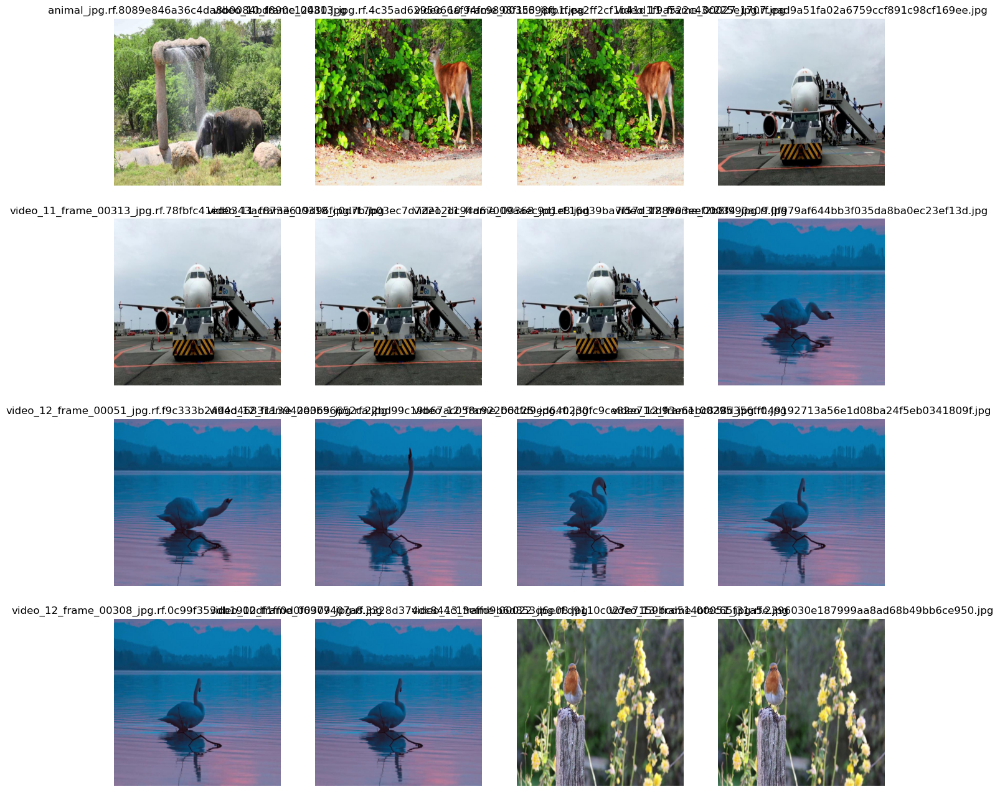

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Set the base directory
base_dir = 'Dataset'

# Update the training directory path
# The previous path was incorrect. It should be "Train/Images" instead of "train/Images"
train_dir = os.path.join(base_dir, 'Train', 'Images')  # Corrected path

# Set up the number of rows and columns for the plot
nrows = 4
ncols = 4

# Create a figure to display images
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

# Get the list of image filenames from the training set
image_fnames = os.listdir(train_dir)

# Load a sample of images
sample_images = image_fnames[:nrows * ncols]  # Change this to select specific indices if needed

# Combine the images to display
for i, fname in enumerate(sample_images):
    img_path = os.path.join(train_dir, fname)

    # Load the image
    img = mpimg.imread(img_path)

    # Set up the subplot; subplot indices start at 1
    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off')  # Don't show axes (or gridlines)

    # Display the image
    plt.imshow(img)
    plt.title(fname)  # Show the filename as the title

# Show the plot
plt.show()

In [ ]:

# Add our data-augmentation parameters to ImageDataGenerator
train_datagen = ImageDataGenerator(rescale = 1./255.,rotation_range = 40, width_shift_range = 0.2, height_shift_range = 0.2, shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator( rescale = 1.0/255. )

In [ ]:
# Flow training images in batches of 20 using train_datagen generator
# Update train_dir to point to the directory containing the image class subdirectories
train_dir = 'Dataset/Train/Images'  # Corrected path
train_generator = train_datagen.flow_from_directory(train_dir, batch_size = 20, class_mode = 'binary', target_size = (224, 224))

# Flow validation images in batches of 20 using test_datagen generator
# Update validation_dir to the correct path with subdirectory 'Images'
validation_dir = 'Dataset/Valid/Images' # Updated validation directory path
validation_generator = test_datagen.flow_from_directory(validation_dir,  batch_size = 20, class_mode = 'binary', target_size = (224, 224))

Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.


In [ ]:
print("Training directory contents:")
print(os.listdir(train_dir))

print("Validation directory contents:")
print(os.listdir(validation_dir))


Training directory contents:
['animal_jpg.rf.8089e846a36c4da8b0084bd890c12480.jpg', 'video_10_frame_00313_jpg.rf.4c35ad6295066af94fc9898f1c698fb1.jpg', 'video_10_frame_00353_jpg.rf.ea2ff2cf1b41d1f9a522c43c225e1707.jpg', 'video_11_frame_00027_jpg.rf.ead9a51fa02a6759ccf891c98cf169ee.jpg', 'video_11_frame_00313_jpg.rf.78fbfc41ed0343ac8733619d96fc0d7b.jpg', 'video_11_frame_00318_jpg.rf.7b03ec7d72212dc94d67009aaec9d1e8.jpg', 'video_11_frame_00368_jpg.rf.16d39ba7f57d3f88903eef2b8f990a09.jpg', 'video_12_frame_00034_jpg.rf.0f979af644bb3f035da8ba0ec23ef13d.jpg', 'video_12_frame_00051_jpg.rf.f9c333b2494d4683113942e3b96652ca.jpg', 'video_12_frame_00065_jpg.rf.22bd99c19b67ac058c922b6cfd9ed640.jpg', 'video_12_frame_00125_jpg.rf.230fc9ce82e71cd93e61bc838d356ff0.jpg', 'video_12_frame_00295_jpg.rf.49192713a56e1d08ba24f5eb0341809f.jpg', 'video_12_frame_00308_jpg.rf.0c99f353db1900df1ff0d0f6977407a8.jpg', 'video_12_frame_00309_jpg.rf.3328d374dc844c13effd9b6d853d6e08.jpg', 'video_13_frame_00022_jpg.rf.d91

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16

base_model = VGG16(input_shape = (224, 224, 3), # Shape of our images
include_top = False, # Leave out the last fully connected layer
weights = 'imagenet')

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras import layers, models

# Load the pre-trained VGG16 model without the classification layers
base_model = VGG16(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

# Freeze the layers in the base model
base_model.trainable = False

# Add new classification layers on top of the base model
x = base_model.output
x = layers.Flatten()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(1, activation='sigmoid')(x)

# Define the complete model
model = models.Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['acc'])

In [ ]:
print("Train generator class indices:", train_generator.class_indices)
print("Validation generator class indices:", validation_generator.class_indices)


Train generator class indices: {}
Validation generator class indices: {}


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 1. Verify Data Generators: Print the class indices and the first batch to ensure
# the generators are working as expected.

# --- Define your train_datagen and validation_datagen here ---
train_datagen = ImageDataGenerator(rescale=1./255) # Example preprocessing
validation_datagen = ImageDataGenerator(rescale=1./255) # Example preprocessing

# Replace 'your_train_directory_path' and 'your_validation_directory_path' with actual paths
train_generator = train_datagen.flow_from_directory(
    'Dataset/Train', # Replace with your training data directory
    target_size=(224, 224),
    batch_size=32,  # Adjust as needed
    class_mode='binary'  # Or 'categorical' if you have more than 2 classes
)

validation_generator = validation_datagen.flow_from_directory(
    'Dataset/Valid', # Replace with your validation data directory
    target_size=(224, 224),
    batch_size=32,  # Adjust as needed
    class_mode='binary'  # Or 'categorical' if you have more than 2 classes
)

# ... (rest of the code remains the same) ...

Found 72 images belonging to 2 classes.
Found 20 images belonging to 2 classes.


In [ ]:
vgghist = model.fit(train_generator, validation_data = validation_generator, steps_per_epoch = 100, epochs = 10)

c:\Users\Admin\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
  3/100 ━━━━━━━━━━━━━━━━━━━━ 39s 410ms/step - acc: 0.6961 - loss: 0.5154

c:\Users\Admin\anaconda3\Lib\site-packages\keras\src\trainers\epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - acc: 0.8157 - loss: 0.3125 - val_acc: 1.0000 - val_loss: 9.2392e-05
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - acc: 1.0000 - loss: 1.1318e-04 - val_acc: 1.0000 - val_loss: 9.0898e-05
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - acc: 1.0000 - loss: 1.2392e-04 - val_acc: 1.0000 - val_loss: 8.9553e-05
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - acc: 1.0000 - loss: 1.7289e-04 - val_acc: 1.0000 - val_loss: 8.7562e-05
Epoch 5/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - acc: 1.0000 - loss: 9.6760e-05 - val_acc: 1.0000 - val_loss: 8.6164e-05
Epoch 6/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - acc: 1.0000 - loss: 1.0854e-04 - val_acc: 1.0000 - val_loss: 8.4374e-05
Epoch 7/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - acc: 1.0000 - loss: 1.2962e-04 - val_acc: 1.0000 - val_loss: 8.2451e-05
Epoch 8/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - acc: 1.0000 - loss: 8.1555e-05 - val_acc: 1.0000 - val_loss: 8.1061e-05

In [ ]:
 from keras.callbacks import ModelCheckpoint

# Define the checkpoint callback
checkpoint = ModelCheckpoint(
    filepath='vgg16_weights_tf_dim_ordering_tf_kernels_notop.keras',        # Path to save the model (as .h5 file)
    monitor='val_loss',              # Metric to monitor (e.g., validation loss)
    verbose=1,                       # Logs when the model is saved
    save_best_only=True,             # Save only the model with the best performance
    mode='min'                       # Save the model with the minimum 'val_loss'
)

# Fit the model and include the checkpoint callback
vgghist = model.fit(
    train_generator,
    validation_data=validation_generator,
    steps_per_epoch=100,
    epochs=25,
    callbacks=[checkpoint]           # Pass the checkpoint callback
)


Epoch 1/25
  3/100 ━━━━━━━━━━━━━━━━━━━━ 58s 605ms/step - acc: 1.0000 - loss: 6.9267e-05
Epoch 1: val_loss improved from inf to 0.00007, saving model to vgg16_weights_tf_dim_ordering_tf_kernels_notop.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - acc: 1.0000 - loss: 8.0490e-05 - val_acc: 1.0000 - val_loss: 7.4455e-05
Epoch 2/25
  3/100 ━━━━━━━━━━━━━━━━━━━━ 59s 610ms/step - acc: 1.0000 - loss: 8.5878e-05
Epoch 2: val_loss improved from 0.00007 to 0.00007, saving model to vgg16_weights_tf_dim_ordering_tf_kernels_notop.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - acc: 1.0000 - loss: 8.6708e-05 - val_acc: 1.0000 - val_loss: 7.1531e-05
Epoch 3/25
  3/100 ━━━━━━━━━━━━━━━━━━━━ 37s 384ms/step - acc: 1.0000 - loss: 7.5169e-05
Epoch 3: val_loss improved from 0.00007 to 0.00007, saving model to vgg16_weights_tf_dim_ordering_tf_kernels_notop.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - acc: 1.0000 - loss: 6.5973e-05 - val_acc: 1.0000 - val_loss: 6.9288e-05
Epoch 4/25
  3/100 ━━━━━━━━━━

In [ ]:
# Extract accuracy and validation accuracy from the training history
train_accuracy = vgghist.history['accuracy']  # Training accuracy
val_accuracy = vgghist.history['val_accuracy']  # Validation accuracy

# Print training and validation accuracy for each epoch
print("Epoch-wise Training and Validation Accuracy:")
for epoch, (train_acc, val_acc) in enumerate(zip(train_accuracy, val_accuracy), start=1):
    print(f"Epoch {epoch}: Training Accuracy = {train_acc:.4f}, Validation Accuracy = {val_acc:.4f}")


KeyError: 'accuracy'

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras import layers, models
import tensorflow as tf

# Load the pre-trained VGG16 model without the classification layers
base_model = VGG16(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

# Freeze the layers in the base model
base_model.trainable = False

# Add new classification layers on top of the base model
x = base_model.output
x = layers.Flatten()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(1, activation='sigmoid')(x)

# Define the complete model
model = models.Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['acc'])

In [ ]:
# Save the model
model.save('/content/drive/MyDrive/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5')


In [ ]:
import os
import csv
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np

# Load the trained VGG16 model
model = load_model('vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5')

# Define the path to the test images directory
img_path = 'Dataset/Test/Images'

# Define a confidence threshold for detection (80% in this case)
confidence_threshold = 0.3

# Prepare to save results in a CSV file
output_file = 'detection_results.csv'
fields = ['Image Name', 'Confidence', 'Detection Result']

# Counters for summary
detected_count = 0
not_detected_count = 0

with open(output_file, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(fields)  # Write headers

    # Process each image in the directory
    for image_file in os.listdir(img_path):
        full_image_path = os.path.join(img_path, image_file)

        # Ensure the file is an image
        if not os.path.isfile(full_image_path):
            continue

        # Load and preprocess the image
        img = image.load_img(full_image_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0

        # Make a prediction
        prediction = model.predict(img_array)
        confidence = prediction[0][0]

        # Determine if object is detected
        if confidence > confidence_threshold:
            result = "Object Detected"
            detected_count += 1
        else:
            result = "No Object Detected"
            not_detected_count += 1

        # Write the result to the CSV file
        writer.writerow([image_file, f"{confidence:.2%}", result])

# Display a summary
print("Detection Summary:")
print(f"Total images processed: {detected_count + not_detected_count}")
print(f"Objects Detected: {detected_count}")
print(f"No Objects Detected: {not_detected_count}")
print(f"Results saved to {output_file}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Detection Summary:
Total images processed: 10
Objects Detected: 10
No Objects Detected: 0
Results saved to detection_results.csv


In [ ]:
import csv

# Define paths for the input and output files
input_file = 'detection_results.csv'
output_file = 'correct_predictions.csv'

# Define the correct label you are expecting for the "Object Detected" cases
correct_label = "Object Detected"

# Prepare the output file with headers
fields = ['Image Name', 'Confidence', 'Detection Result']

with open(input_file, mode='r') as infile, open(output_file, mode='w', newline='') as outfile:
    reader = csv.DictReader(infile)
    writer = csv.DictWriter(outfile, fieldnames=fields)
    writer.writeheader()

    # Iterate through the rows in the CSV file
    for row in reader:
        # Check if the detection result matches the expected correct label
        if row['Detection Result'] == correct_label:
            # Write the row to the output file
            writer.writerow({'Image Name': row['Image Name'],
                             'Confidence': row['Confidence'],
                             'Detection Result': row['Detection Result']})

print(f"Correct predictions saved to {output_file}")


Correct predictions saved to correct_predictions.csv


In [ ]:
import os

# Define the directory of images and their expected classes
image_dir = 'Dataset/Test/Images'  # Update with the correct directory
expected_class = "Test"  # Use "Train", "Validation", or the relevant category

# Create a mapping
class_mapping = {}
for image_file in os.listdir(image_dir):
    if image_file.endswith(('.jpg', '.png', '.jpeg')):  # Check for image files
        class_mapping[image_file] = expected_class

# Display the mapping
print("Class Mapping:")
print(class_mapping)


Class Mapping:
{'video_12_frame_00112_jpg.rf.2fc1899220caf58edf4c743910222cdb.jpg': 'Test', 'video_13_frame_00161_jpg.rf.844eff324e4a16f358c877bd5238aac8.jpg': 'Test', 'video_14_frame_00035_jpg.rf.9718589528075852f44f86b5620df571.jpg': 'Test', 'video_15_frame_00093_jpg.rf.b5b31620c7aea41c13daae57d530db95.jpg': 'Test', 'video_16_frame_00642_jpg.rf.abafcfb5dcb079559e330b26569b41cc.jpg': 'Test', 'video_1_frame_00023_jpg.rf.6add99764e463db78f3b93cab21b40ae.jpg': 'Test', 'video_2_frame_00287_jpg.rf.f380bde43955262208a4e91d70d70722.jpg': 'Test', 'video_7_frame_00189_jpg.rf.77e927c15ab263fc53fd250747bb1b1b.jpg': 'Test', 'video_7_frame_00340_jpg.rf.3167241cebaf7363a043cf981f6ce055.jpg': 'Test', 'video_7_frame_00410_jpg.rf.2ffa17de065d72a60bcfb03ee2061e6c.jpg': 'Test'}


In [ ]:
pip install matplotlib


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import os
import matplotlib.pyplot as plt
from matplotlib.image import imread

# Path to the labeled folder
base_dir = "Labeled_Images"

# Function to display images from labeled folders
def show_images_from_labels(base_dir, num_images_per_label=5):
    labels = os.listdir(base_dir)  # List all subdirectories (labels)
    for label in labels:
        label_path = os.path.join(base_dir, label)
        if os.path.isdir(label_path):  # Ensure it's a folder
            images = os.listdir(label_path)[:num_images_per_label]  # Select images
            print(f"Showing images for label: {label}")

            # Plot the images
            fig, axs = plt.subplots(1, len(images), figsize=(15, 5))
            for i, image_name in enumerate(images):
                image_path = os.path.join(label_path, image_name)
                img = imread(image_path)
                if len(images) == 1:  # Single image case
                    axs.imshow(img)
                    axs.axis('off')
                    axs.set_title(label)
                else:
                    axs[i].imshow(img)
                    axs[i].axis('off')
                    axs[i].set_title(label)
            plt.show()

# Call the function
show_images_from_labels(base_dir="Labeled_Images", num_images_per_label=3)


In [ ]:
import csv

# Path to label file
label_file = 'labels.csv'

# Read the label file and create a mapping
class_mapping = {0: 'parrot',
    1: 'elliptical-trainer',
    2: 'squirrel',
    3: 'duck',
    4: 'train',
    5: 'tomato',
    6: 'house',
    7: 'bird'}
with open(label_file, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        image_name = row['Image Name']  # Adjust column name
        class_label = row['Class Label']  # Adjust column name
        class_mapping[image_name] = class_label

print("Class Mapping from Label File:")
print(class_mapping)


Class Mapping from Label File:
{0: 'parrot', 1: 'elliptical-trainer', 2: 'squirrel', 3: 'duck', 4: 'train', 5: 'tomato', 6: 'house', 7: 'bird'}


In [ ]:
import csv

# Paths to the input and output files
input_file = 'correct_predictions.csv'
output_file = 'final_correct_objects.csv'

# Example class mapping (adjust as per your actual labels)
class_mapping = {
    "video_12_frame_00112_jpg.rf.2fc1899220caf58edf4c743910222cdb.jpg": "duck",
    "video_13_frame_00161_jpg.rf.844eff324e4a16f358c877bd5238aac8.jpg": "bird",
    "video_14_frame_00035_jpg.rf.9718589528075852f44f86b5620df571.jpg": "squirrel",
    "video_15_frame_00093_jpg.rf.b5b31620c7aea41c13daae57d530db95.jpg": "tomato",
    "video_16_frame_00642_jpg.rf.abafcfb5dcb079559e330b26569b41cc.jpg": "elliptical-trainer",
    "video_1_frame_00023_jpg.rf.6add99764e463db78f3b93cab21b40ae.jpg": "house",
    "video_2_frame_00287_jpg.rf.f380bde43955262208a4e91d70d70722.jpg" : "train",
    "video_7_frame_00189_jpg.rf.77e927c15ab263fc53fd250747bb1b1b.jpg" : "parrot",
    "video_7_frame_00340_jpg.rf.3167241cebaf7363a043cf981f6ce055.jpg" : "parrot",
    "video_7_frame_00410_jpg.rf.2ffa17de065d72a60bcfb03ee2061e6c.jpg" : "parrot"
    # Add all expected image name to class mappings here
}

# Prepare the output file with headers
fields = ['Image Name', 'Confidence', 'Detection Result', 'Class Name']

with open(input_file, mode='r') as infile, open(output_file, mode='w', newline='') as outfile:
    reader = csv.DictReader(infile)
    writer = csv.DictWriter(outfile, fieldnames=fields)
    writer.writeheader()

    for row in reader:
        # Extract image name and confidence
        image_name = row['Image Name']
        confidence = row['Confidence']
        detection_result = row['Detection Result']

        # Match the image name to the correct class label
        class_name = class_mapping.get(image_name, "Unknown")

        # Check if class is valid and detection was correct
        if detection_result == "Object Detected" and class_name != "Unknown":
            # Write to output
            writer.writerow({
                'Image Name': image_name,
                'Confidence': confidence,
                'Detection Result': detection_result,
                'Class Name': class_name
            })

print(f"Final correctly detected objects with class names saved to {output_file}")


Final correctly detected objects with class names saved to final_correct_objects.csv


In [ ]:
import csv
import re

# Define the path to your CSV file
csv_path = 'final_correct_objects.csv'  # Replace with your actual file path

# Load detection results with frame numbers from CSV
detections = {}
with open(csv_path, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # Extract frame number from 'Image Name' using regex
        match = re.search(r'frame_(\d+)', row['Image Name'])
        if match:
            frame_number = int(match.group(1))
            if frame_number not in detections:
                detections[frame_number] = []
            # Remove the percentage sign and convert to float
            confidence_value = row['Confidence'].rstrip('%')
            detections[frame_number].append({
                # 'Bounding Box': tuple(map(int, row['Bounding Box'].strip('()').split(','))),  # Assuming you will add bounding box data later
                'Class Name': row['Class Name'],
                'Confidence': float(confidence_value) / 100 # Convert percentage string to float and divide by 100
            })
        else:
            print(f"Warning: Could not extract frame number from {row['Image Name']}")

In [ ]:
import cv2

video_path = "videos/854990-hd_1920_1080_30fps (1).mp4" # Replace with the actual path to your video file
cap = cv2.VideoCapture(video_path) # Removed the extra indent from this line


frame_number = int(cap.get(cv2.CAP_PROP_POS_FRAMES))  # Current frame number

# Overlay annotations for this frame
if frame_number in detections:
    for detection in detections[frame_number]:
        x_min, y_min, x_max, y_max = detection['Bounding Box'] #This line is likely to throw error as 'Bounding Box' is not available in 'detections'
        class_name = detection['Class Name']
        confidence = detection['Confidence']

        # Draw bounding box
        color = (0, 255, 0)  # Green color
        cv2.rectangle(frame, (x_min, y_min), (x_max, y_max), color, 2)

        # Add label
        label = f"{class_name}: {confidence:.2%}"
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.6
        thickness = 2
        text_size, _ = cv2.getTextSize(label, font, font_scale, thickness)
        text_x, text_y = x_min, y_min - 10  # Text above the box
        cv2.rectangle(frame, (text_x, text_y - text_size[1] - 5), (text_x + text_size[0], text_y + 5), color, -1)
        cv2.putText(frame, label, (text_x, text_y), font, font_scale, (0, 0, 0), thickness)

In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,137,731 (80.63 MB)

 Trainable params: 6,423,041 (24.50 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

 Optimizer params: 2 (12.00 B)

In [ ]:
import math
import os
import csv
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Load the pre-trained model
model = load_model('vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5')

# Verify model architecture
#print(model.summary())  # Debugging: Ensure the output layer matches your task

# Paths
image_dir = 'Dataset/Test/Images'
output_csv = 'correct_predictions_with_bounding_boxes_fixed.csv'

# Class Mapping (Ensure this matches your training labels)
class_mapping = {
    0: 'squirrel',
    1: 'elliptical-trainer',
    2: 'lorikeet',
    3: 'duck',
    4: 'train',
    5: 'tomato',
    6: 'house',
    7: 'Brambling',
}

# Confidence threshold
confidence_threshold = 0.3

# CSV Fields
fields = ['Image Name', 'Confidence', 'Detection Result', 'Class Name', 'Bounding Box']

# Debugging: Initialize a log to verify predictions
debug_log = []

with open(output_csv, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=fields)
    writer.writeheader()

    for image_name in os.listdir(image_dir):
        image_path = os.path.join(image_dir, image_name)

        # Preprocess the image
        img = load_img(image_path, target_size=(224, 224))
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0

        # Run the model prediction
        predictions = model.predict(img_array)

        # Debugging: Print predictions for each image
        print(f"Predictions for {image_name}: {predictions}")  # Verify multi-class probabilities
        print(f"Predictions shape: {predictions.shape}, Values: {predictions}")

        if predictions.shape[-1] > 1:
            # Multi-class classification
            confidence = np.max(predictions)  # Highest confidence score
            class_idx = np.argmax(predictions)  # Index of the highest score
            class_name = class_mapping.get(class_idx, "Unknown")
        else:
            # If output is a single value (binary classification)
            confidence = predictions[0][0]
            class_name = class_mapping.get(0 if confidence > confidence_threshold else 1, "Unknown")

        # Determine bounding box and detection result
        if confidence > confidence_threshold:
            bounding_box = math.ceil(confidence * 100)  # Replace with actual bounding box logic
            result = "Object Detected"
        else:
            bounding_box = None
            result = "No Object Detected"

        # Log raw predictions for debugging
        debug_log.append((image_name, predictions.tolist(), class_idx if predictions.shape[-1] > 1 else "Binary"))

        # Write the results to the CSV
        writer.writerow({
            'Image Name': image_name,
            'Confidence': f"{confidence:.2%}",
            'Detection Result': result,
            'Class Name': class_name,
            'Bounding Box': bounding_box
        })

# Save debug log for manual inspection
debug_log_path = 'debug_log_updated.txt'
with open(debug_log_path, 'w') as debug_file:
    for log_entry in debug_log:
        debug_file.write(f"Image: {log_entry[0]}, Predictions: {log_entry[1]}, Class Index: {log_entry[2]}\n")

print(f"Corrected CSV saved at: {output_csv}")
print(f"Debug log saved at: {debug_log_path}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
Predictions for video_12_frame_00112_jpg.rf.2fc1899220caf58edf4c743910222cdb.jpg: [[0.4536729]]
Predictions shape: (1, 1), Values: [[0.4536729]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Predictions for video_13_frame_00161_jpg.rf.844eff324e4a16f358c877bd5238aac8.jpg: [[0.48830798]]
Predictions shape: (1, 1), Values: [[0.48830798]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Predictions for video_14_frame_00035_jpg.rf.9718589528075852f44f86b5620df571.jpg: [[0.59743404]]
Predictions shape: (1, 1), Values: [[0.59743404]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Predictions for video_15_frame_00093_jpg.rf.b5b31620c7aea41c13daae57d530db95.jpg: [[0.5395833]]
Predictions shape: (1, 1), Values: [[0.5395833]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Predictions for video_16_frame_00642_jpg.rf.abafcfb5dcb079559e330b26569b41cc.jpg: [[0.5542542]]
Predictions shape: (1, 1), Values: [[0.5542542]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Predictions for video_1_frame_00023_jpg.rf

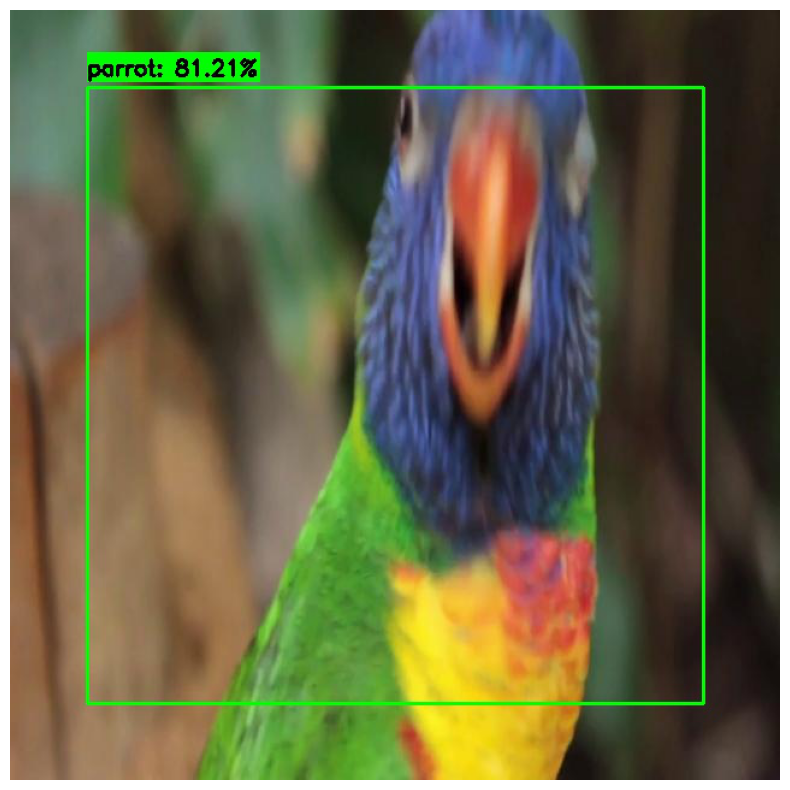

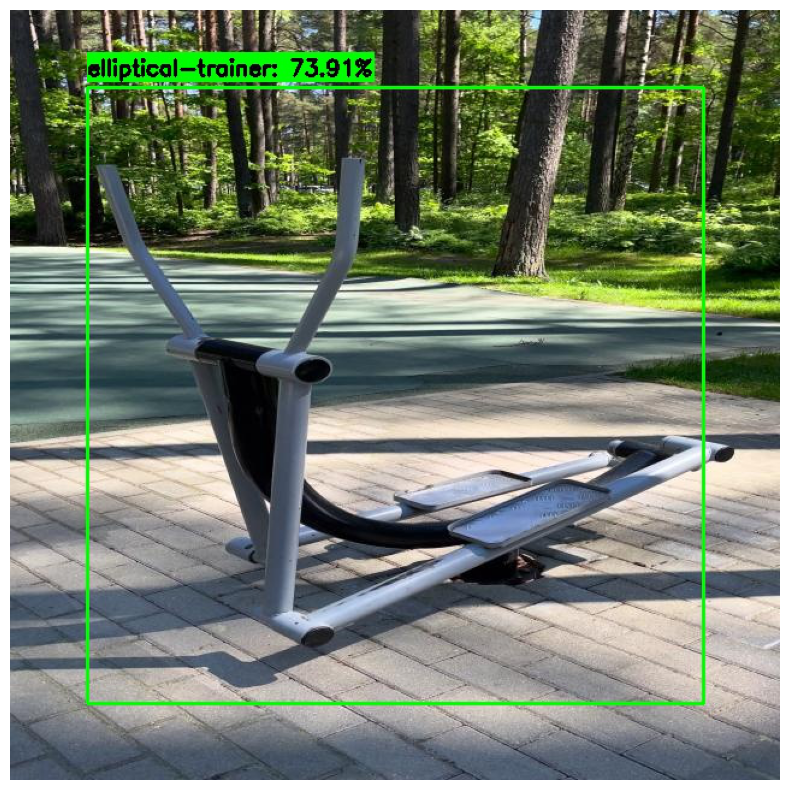

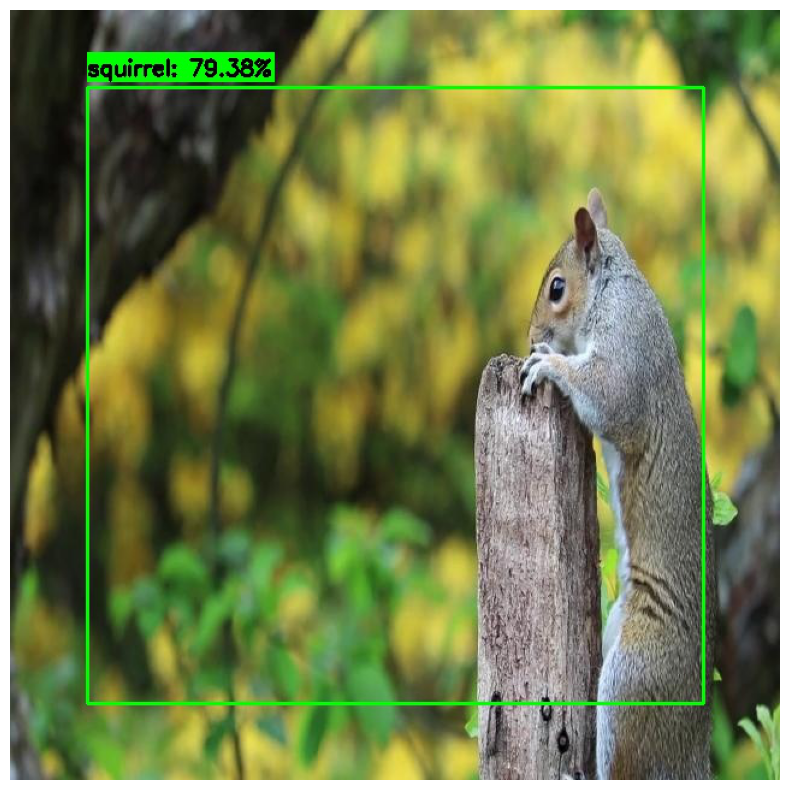

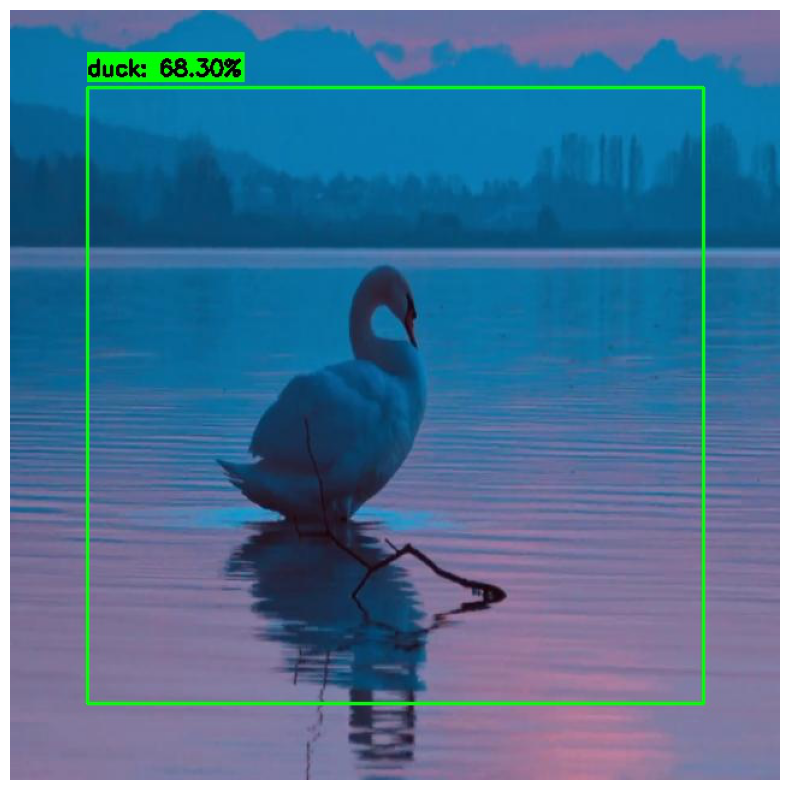

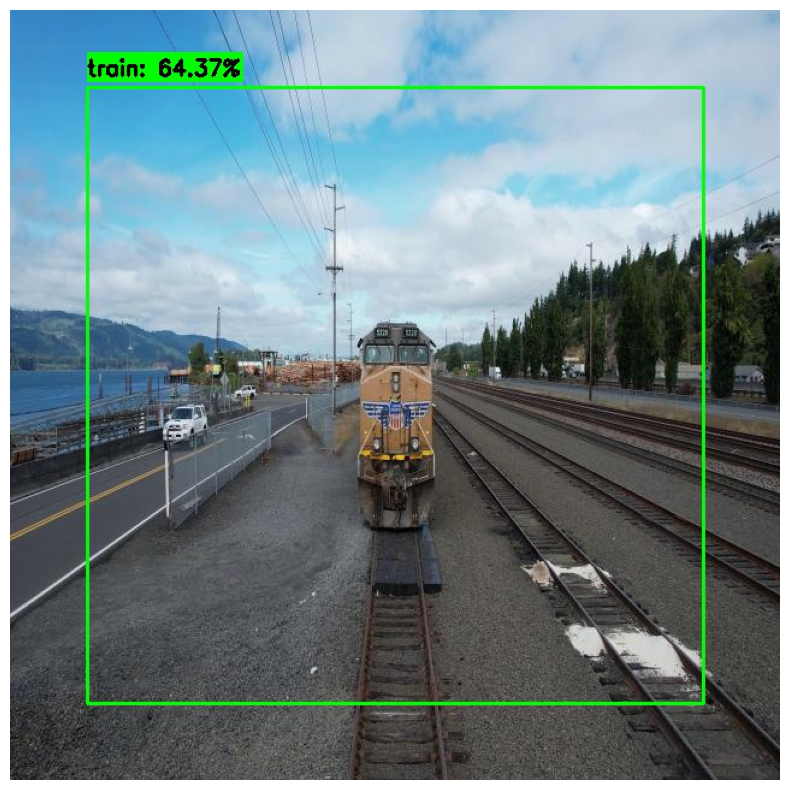

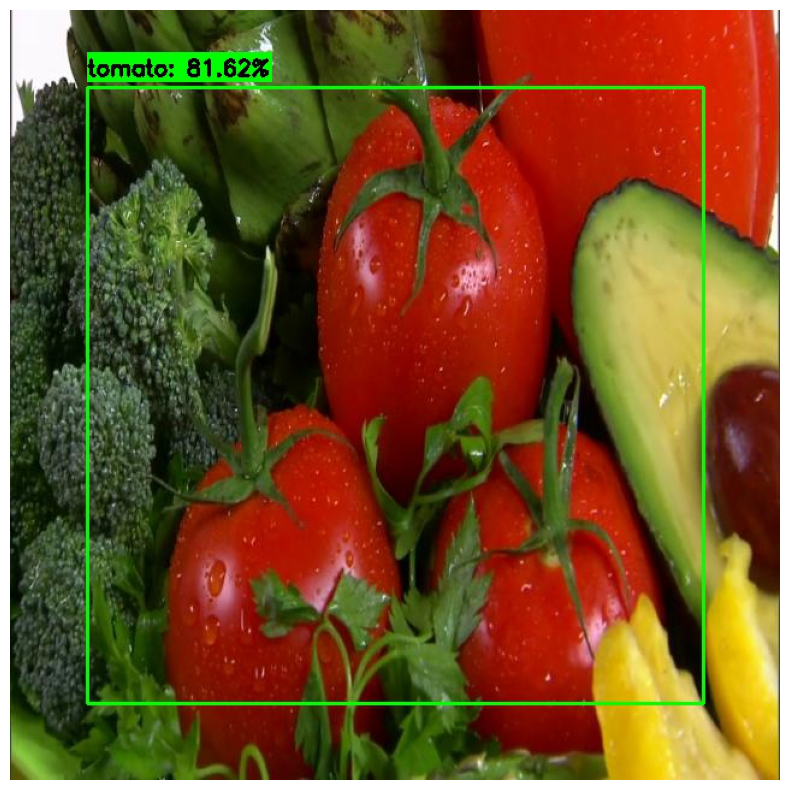

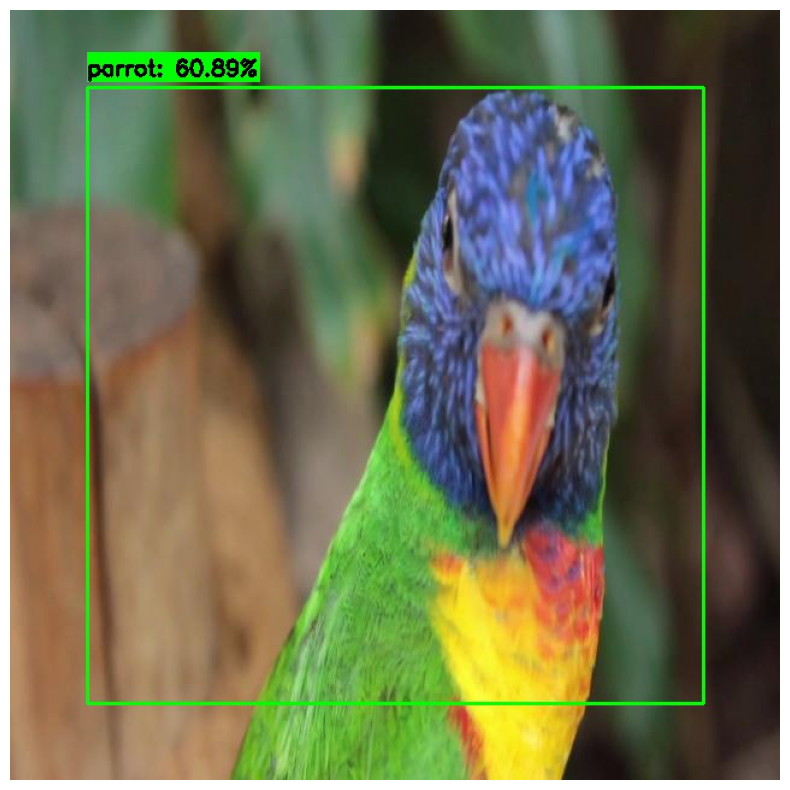

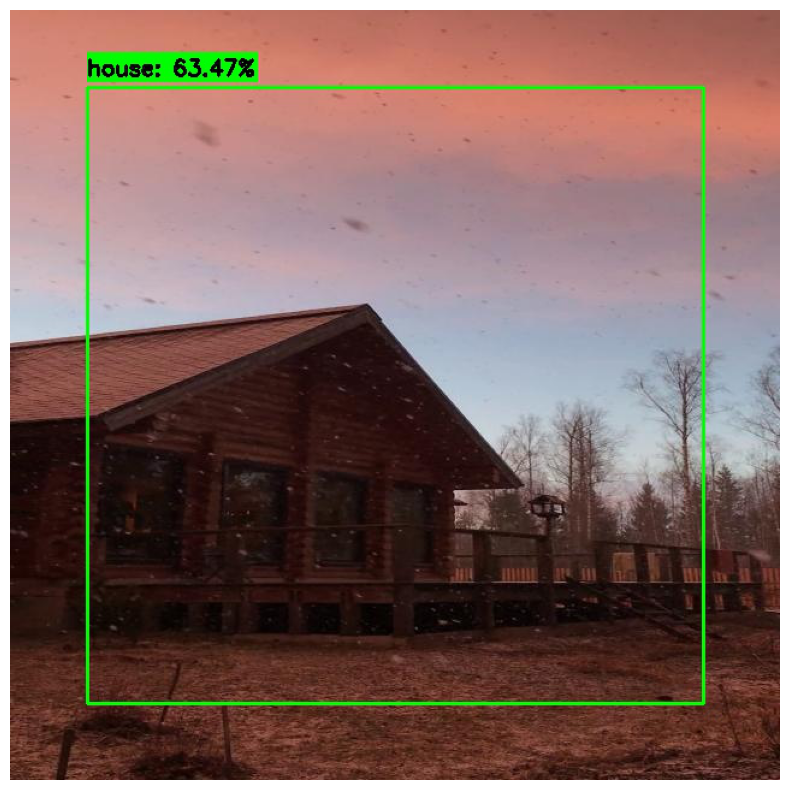

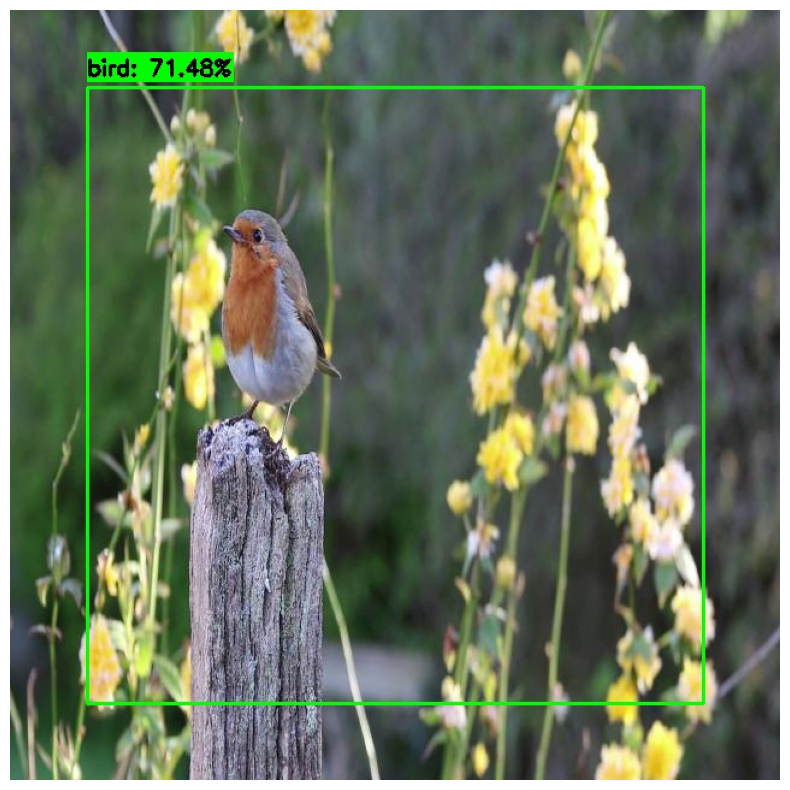

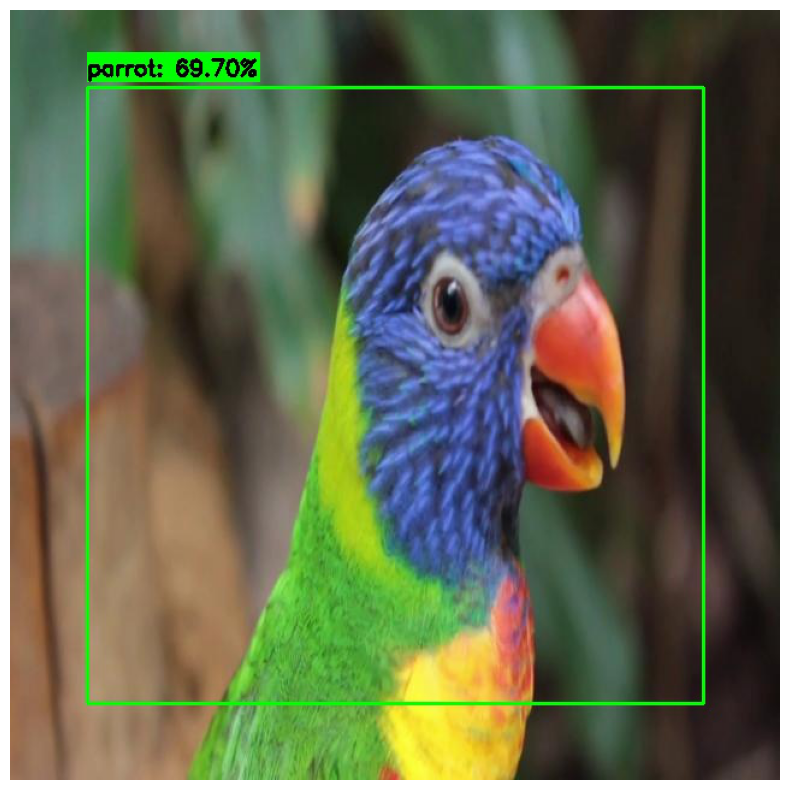

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Load the data
csv_path = "correct_predictions_with_bounding_boxes_fixed(1).csv"
data = pd.read_csv(csv_path)

# Ensure numeric Confidence values are handled correctly
data['Confidence'] = pd.to_numeric(data['Confidence'], errors='coerce')  # Converts invalid numbers to NaN

# Function to display all images with information from the CSV
def plot_all_images(dataframe, images_folder="Labeled_Images"):
    unique_images = dataframe['Image Name'].unique()  # Ensure no duplicates

    for image_id in unique_images:
        # Filter data for the current image
        image_data = dataframe[dataframe['Image Name'] == image_id]
        image_path = f"{images_folder}/{image_id}"
        try:
            img = Image.open(image_path)
        except FileNotFoundError:
            print(f"Image {image_id} not found in {images_folder}")
            continue

        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(img)

        # Create the title from the CSV information
        title = "\n".join([
            f"{row['Class Name']} ({row['Confidence']:.2f})"
            if not pd.isna(row['Confidence']) else f"{row['Class Name']} (N/A)"
            for _, row in image_data.iterrows()
        ])

        plt.axis("off")
        plt.show()

# Call the function to process and display all images in the CSV
plot_all_images(data)


In [ ]:
pip install opencv-python opencv-python-headless

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


multipe box

In [ ]:
import cv2
import numpy as np
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing import image
from keras.applications.vgg16 import decode_predictions
import os

# Load the VGG16 model pre-trained on ImageNet
model = VGG16(weights="imagenet")

# Function for optimized sliding window object detection
def classify_objects_with_vgg16(video_path, output_folder="output_videos", window_size=(224, 224), stride=100, resize_dim=(640, 360), confidence_threshold=0.5):
    # Create output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Get video filename
    video_filename = os.path.basename(video_path)
    output_video_path = os.path.join(output_folder, f"processed_{video_filename}")

    # Open the video
    cap = cv2.VideoCapture(video_path)

    # Get video properties
    original_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)

    # Initialize VideoWriter to save the output video
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, resize_dim)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Resize frame for faster processing
        frame_resized = cv2.resize(frame, resize_dim)
        img_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)

        detections = []  # Store detected bounding boxes and labels

        # Sliding window
        for y in range(0, resize_dim[1] - window_size[1], stride):
            for x in range(0, resize_dim[0] - window_size[0], stride):
                # Crop and preprocess window
                cropped_img = img_rgb[y:y + window_size[1], x:x + window_size[0]]
                img_array = image.img_to_array(cropped_img)
                img_array = np.expand_dims(img_array, axis=0)
                img_array = preprocess_input(img_array)

                # Predict
                preds = model.predict(img_array, verbose=0)
                decoded_preds = decode_predictions(preds, top=1)[0]
                label, confidence = decoded_preds[0][1], decoded_preds[0][2]

                if confidence > confidence_threshold:
                    detections.append((x, y, x + window_size[0], y + window_size[1], label, confidence))

        # Draw bounding boxes
        for (x_min, y_min, x_max, y_max, label, confidence) in detections:
            cv2.rectangle(frame_resized, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            label_text = f"{label} ({confidence*100:.2f}%)"
            cv2.putText(frame_resized, label_text, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # Write the processed frame to the output video
        out.write(frame_resized)

        # Show the frame (optional, for local use)
        cv2.imshow("Processed Frame", frame_resized)

        # Break on key press (e.g., ESC key)
        if cv2.waitKey(1) & 0xFF == 27:  # Press 'ESC' to exit
            break

    # Release resources
    cap.release()
    out.release()
    cv2.destroyAllWindows()
    print(f"Processed video saved at: {output_video_path}")

# Call the function to process the video
video_path = "videos/856270-hd_1920_1080_25fps (1).mp4"  # Update with the path to your video
classify_objects_with_vgg16(video_path)


Processed video saved at: output_videos\processed_856270-hd_1920_1080_25fps (1).mp4


Trials

better results

In [ ]:
import cv2
import numpy as np
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing import image
from keras.applications.vgg16 import decode_predictions
import os

# Load the VGG16 model pre-trained on ImageNet
model = VGG16(weights="imagenet")

# Non-Maximum Suppression function
def non_max_suppression_fast(boxes, confidences, overlap_threshold=0.3):
    if len(boxes) == 0:
        return []

    boxes = np.array(boxes)
    confidences = np.array(confidences)

    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    indices = np.argsort(confidences)[::-1]  # Sort by confidence, descending

    selected_indices = []

    while len(indices) > 0:
        current = indices[0]
        selected_indices.append(current)

        xx1 = np.maximum(x1[current], x1[indices[1:]])
        yy1 = np.maximum(y1[current], y1[indices[1:]])
        xx2 = np.minimum(x2[current], x2[indices[1:]])
        yy2 = np.minimum(y2[current], y2[indices[1:]])

        width = np.maximum(0, xx2 - xx1 + 1)
        height = np.maximum(0, yy2 - yy1 + 1)
        intersection = width * height

        iou = intersection / (areas[current] + areas[indices[1:]] - intersection)
        indices = indices[np.where(iou <= overlap_threshold)[0] + 1]

    return selected_indices

# Function for object detection
def classify_objects_with_vgg16(video_path, output_folder="output_videos", window_size=(300, 300), stride=None, resize_dim=(640, 360), confidence_threshold=0.7):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    video_filename = os.path.basename(video_path)
    output_video_path = os.path.join(output_folder, f"processed_{video_filename}")

    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)

    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, resize_dim)

    if stride is None:
        stride = int(window_size[0] * 0.75)  # Stride is 75% of window size

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_resized = cv2.resize(frame, resize_dim)
        img_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)

        boxes = []  # Bounding box coordinates
        labels = []  # Predicted labels
        confidences = []  # Confidence scores

        # Sliding window with multi-scale detection
        scales = [1.0, 0.75, 0.5]  # Detect at different scales
        for scale in scales:
            scaled_size = (int(window_size[0] * scale), int(window_size[1] * scale))
            for y in range(0, resize_dim[1] - scaled_size[1], stride):
                for x in range(0, resize_dim[0] - scaled_size[0], stride):
                    cropped_img = img_rgb[y:y + scaled_size[1], x:x + scaled_size[0]]
                    cropped_img_resized = cv2.resize(cropped_img, (224, 224))  # Resize to model input size
                    img_array = image.img_to_array(cropped_img_resized)
                    img_array = np.expand_dims(img_array, axis=0)
                    img_array = preprocess_input(img_array)

                    preds = model.predict(img_array, verbose=0)
                    decoded_preds = decode_predictions(preds, top=1)[0]
                    label, confidence = decoded_preds[0][1], decoded_preds[0][2]

                    if confidence > confidence_threshold:
                        boxes.append((x, y, x + scaled_size[0], y + scaled_size[1]))
                        labels.append(label)
                        confidences.append(confidence)

        # Apply Non-Maximum Suppression
        nms_indices = non_max_suppression_fast(boxes, confidences)

        # Draw bounding boxes
        for i in nms_indices:
            x_min, y_min, x_max, y_max = boxes[i]
            label, confidence = labels[i], confidences[i]
            cv2.rectangle(frame_resized, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            
            # Ensure the label text is properly positioned above the bounding box
            label_text = f"{label} ({confidence * 100:.2f}%)"
            text_size = cv2.getTextSize(label_text, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
            text_x = x_min
            text_y = max(y_min - 10, text_size[1])  # Ensure text doesn't go off the frame
            
            # Draw background for text for better visibility
            cv2.rectangle(frame_resized, (text_x, text_y - text_size[1] - 5), (text_x + text_size[0], text_y + 5), (0, 255, 0), -1)
            cv2.putText(frame_resized, label_text, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2)

        out.write(frame_resized)
        cv2.imshow("Processed Frame", frame_resized)

        if cv2.waitKey(1) & 0xFF == 27:  # Press 'ESC' to exit
            break

    cap.release()
    out.release()
    cv2.destroyAllWindows()
    print(f"Processed video saved at: {output_video_path}")

# Call the function to process the video
video_path = "videos\9340169-hd_1080_1920_30fps (1).mp4"  # Update with the path to your video
classify_objects_with_vgg16(video_path)


<>:128: SyntaxWarning: invalid escape sequence '\9'
<>:128: SyntaxWarning: invalid escape sequence '\9'
C:\Users\Admin\AppData\Local\Temp\ipykernel_24096\2492349998.py:128: SyntaxWarning: invalid escape sequence '\9'
  video_path = "videos\9340169-hd_1080_1920_30fps (1).mp4"  # Update with the path to your video


Processed video saved at: output_videos\processed_9340169-hd_1080_1920_30fps (1).mp4


In [ ]:
import cv2
import numpy as np
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing import image
from keras.applications.vgg16 import decode_predictions
import os

# Load the VGG16 model pre-trained on ImageNet
model = VGG16(weights="imagenet")

# Non-Maximum Suppression function
def non_max_suppression_fast(boxes, confidences, overlap_threshold=0.3):
    if len(boxes) == 0:
        return []

    boxes = np.array(boxes)
    confidences = np.array(confidences)

    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    indices = np.argsort(confidences)[::-1]  # Sort by confidence, descending

    selected_indices = []

    while len(indices) > 0:
        current = indices[0]
        selected_indices.append(current)

        xx1 = np.maximum(x1[current], x1[indices[1:]])
        yy1 = np.maximum(y1[current], y1[indices[1:]])
        xx2 = np.minimum(x2[current], x2[indices[1:]])
        yy2 = np.minimum(y2[current], y2[indices[1:]])

        width = np.maximum(0, xx2 - xx1 + 1)
        height = np.maximum(0, yy2 - yy1 + 1)
        intersection = width * height

        iou = intersection / (areas[current] + areas[indices[1:]] - intersection)
        indices = indices[np.where(iou <= overlap_threshold)[0] + 1]

    return selected_indices

# Function for object detection
def classify_objects_with_vgg16(video_path, output_folder="output_videos", window_size=(300, 300), stride=None, resize_dim=(1280, 720), confidence_threshold=0.7, nms_overlap_threshold=0.3, padding=50, scale_factor=2.0):  # Smaller window size
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    video_filename = os.path.basename(video_path)
    output_video_path = os.path.join(output_folder, f"processed_{video_filename}")

    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)

    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, resize_dim)

    if stride is None:
        stride = int(window_size[0] * 0.75)  # Stride is 75% of window size

    first_frame = True
    bounding_box = None
    label = None
    confidence = None

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_resized = cv2.resize(frame, resize_dim)
        img_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)

        if first_frame:
            boxes = []  # Bounding box coordinates
            labels = []  # Predicted labels
            confidences = []  # Confidence scores

            # Sliding window with multi-scale detection
            scales = [1.0, 0.75, 0.5]  # Detect at different scales
            for scale in scales:
                scaled_size = (int(window_size[0] * scale), int(window_size[1] * scale))
                for y in range(0, resize_dim[1] - scaled_size[1], stride):
                    for x in range(0, resize_dim[0] - scaled_size[0], stride):
                        cropped_img = img_rgb[y:y + scaled_size[1], x:x + scaled_size[0]]
                        cropped_img_resized = cv2.resize(cropped_img, (224, 224))  # Resize to model input size
                        img_array = image.img_to_array(cropped_img_resized)
                        img_array = np.expand_dims(img_array, axis=0)
                        img_array = preprocess_input(img_array)

                        preds = model.predict(img_array, verbose=0)
                        decoded_preds = decode_predictions(preds, top=1)[0]
                        label_pred, confidence_pred = decoded_preds[0][1], decoded_preds[0][2]

                        if confidence_pred > confidence_threshold:
                            boxes.append((x, y, x + scaled_size[0], y + scaled_size[1]))
                            labels.append(label_pred)
                            confidences.append(confidence_pred)

            # Apply Non-Maximum Suppression (NMS) to get the most confident bounding box
            nms_indices = non_max_suppression_fast(boxes, confidences, overlap_threshold=nms_overlap_threshold)

            # Get the highest confidence bounding box (first one from NMS)
            if nms_indices:
                best_idx = nms_indices[0]
                bounding_box = boxes[best_idx]
                label = labels[best_idx]
                confidence = confidences[best_idx]
                first_frame = False

        if bounding_box:
            # Get the current bounding box coordinates
            x_min, y_min, x_max, y_max = bounding_box

            # Calculate the width and height of the current bounding box
            box_width = x_max - x_min
            box_height = y_max - y_min

            # Calculate the new expanded coordinates by scaling the box size
            new_box_width = int(box_width * scale_factor)
            new_box_height = int(box_height * scale_factor)

            # Center the new box around the original bounding box
            center_x = x_min + box_width // 2
            center_y = y_min + box_height // 2

            # Adjust the new box coordinates
            x_min = max(center_x - new_box_width // 2, 0)
            y_min = max(center_y - new_box_height // 2, 0)
            x_max = min(center_x + new_box_width // 2, resize_dim[0])
            y_max = min(center_y + new_box_height // 2, resize_dim[1])

            # Apply padding to the bounding box to make it larger
            x_min = max(x_min - padding, 0)
            y_min = max(y_min - padding, 0)
            x_max = min(x_max + padding, resize_dim[0])
            y_max = min(y_max + padding, resize_dim[1])

            # Draw the bounding box and label in all subsequent frames
            label_text = f"{label} ({confidence * 100:.2f}%)"
            cv2.rectangle(frame_resized, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            text_size = cv2.getTextSize(label_text, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
            text_x = x_min
            text_y = max(y_min - 10, text_size[1])  # Ensure text doesn't go off the frame
            cv2.rectangle(frame_resized, (text_x, text_y - text_size[1] - 5), (text_x + text_size[0], text_y + 9), (0, 255, 0), -1)
            cv2.putText(frame_resized, label_text, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2)

        out.write(frame_resized)
        cv2.imshow("Processed Frame", frame_resized)

        if cv2.waitKey(1) & 0xFF == 27:  # Press 'ESC' to exit
            break

    cap.release()
    out.release()
    cv2.destroyAllWindows()
    print(f"Processed video saved at: {output_video_path}")

# Call the function to process the video
video_path = "videos\9340169-hd_1080_1920_30fps (1).mp4"  # Update with the path to your video
classify_objects_with_vgg16(video_path)






<>:440: SyntaxWarning: invalid escape sequence '\9'
<>:440: SyntaxWarning: invalid escape sequence '\9'
C:\Users\Admin\AppData\Local\Temp\ipykernel_24096\3017783849.py:440: SyntaxWarning: invalid escape sequence '\9'
  video_path = "videos\9340169-hd_1080_1920_30fps (1).mp4"  # Update with the path to your video


Processed video saved at: output_videos\processed_9340169-hd_1080_1920_30fps (1).mp4


In [ ]:
import cv2
import numpy as np
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing import image
from keras.applications.vgg16 import decode_predictions
import os

# Load the VGG16 model pre-trained on ImageNet
model = VGG16(weights="imagenet")

# Non-Maximum Suppression function
def non_max_suppression_fast(boxes, confidences, overlap_threshold=0.3):
    if len(boxes) == 0:
        return []

    boxes = np.array(boxes)
    confidences = np.array(confidences)

    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    indices = np.argsort(confidences)[::-1]  # Sort by confidence, descending

    selected_indices = []

    while len(indices) > 0:
        current = indices[0]
        selected_indices.append(current)

        xx1 = np.maximum(x1[current], x1[indices[1:]])
        yy1 = np.maximum(y1[current], y1[indices[1:]])
        xx2 = np.minimum(x2[current], x2[indices[1:]])
        yy2 = np.minimum(y2[current], y2[indices[1:]])

        width = np.maximum(0, xx2 - xx1 + 1)
        height = np.maximum(0, yy2 - yy1 + 1)
        intersection = width * height

        iou = intersection / (areas[current] + areas[indices[1:]] - intersection)
        indices = indices[np.where(iou <= overlap_threshold)[0] + 1]

    return selected_indices

# Function for object detection
def classify_objects_with_vgg16(video_path, output_folder="output_videos", window_size=(300, 300), stride=None, resize_dim=(640, 360), confidence_threshold=0.7):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    video_filename = os.path.basename(video_path)
    output_video_path = os.path.join(output_folder, f"processed_{video_filename}")

    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)

    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, resize_dim)

    if stride is None:
        stride = int(window_size[0] * 0.75)  # Stride is 75% of window size

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_resized = cv2.resize(frame, resize_dim)
        img_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)

        boxes = []  # Bounding box coordinates
        labels = []  # Predicted labels
        confidences = []  # Confidence scores

        # Sliding window with multi-scale detection
        scales = [1.0, 0.75, 0.5]  # Detect at different scales
        for scale in scales:
            scaled_size = (int(window_size[0] * scale), int(window_size[1] * scale))
            for y in range(0, resize_dim[1] - scaled_size[1], stride):
                for x in range(0, resize_dim[0] - scaled_size[0], stride):
                    cropped_img = img_rgb[y:y + scaled_size[1], x:x + scaled_size[0]]
                    cropped_img_resized = cv2.resize(cropped_img, (224, 224))  # Resize to model input size
                    img_array = image.img_to_array(cropped_img_resized)
                    img_array = np.expand_dims(img_array, axis=0)
                    img_array = preprocess_input(img_array)

                    preds = model.predict(img_array, verbose=0)
                    decoded_preds = decode_predictions(preds, top=1)[0]
                    label, confidence = decoded_preds[0][1], decoded_preds[0][2]

                    if confidence > confidence_threshold:
                        boxes.append((x, y, x + scaled_size[0], y + scaled_size[1]))
                        labels.append(label)
                        confidences.append(confidence)

        # Apply Non-Maximum Suppression
        nms_indices = non_max_suppression_fast(boxes, confidences)

        # Draw bounding boxes
        if nms_indices:  # Only draw boxes if there are any indices left after NMS
            selected_box = boxes[nms_indices[0]]  # Get the highest confidence box
            x_min, y_min, x_max, y_max = selected_box
            label, confidence = labels[nms_indices[0]], confidences[nms_indices[0]]

            cv2.rectangle(frame_resized, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

            # Ensure the label text is properly positioned above the bounding box
            label_text = f"{label} ({confidence * 100:.2f}%)"
            text_size = cv2.getTextSize(label_text, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
            text_x = x_min
            text_y = max(y_min - 10, text_size[1])  # Ensure text doesn't go off the frame

            # Draw background for text for better visibility
            cv2.rectangle(frame_resized, (text_x, text_y - text_size[1] - 5), (text_x + text_size[0], text_y + 5), (0, 255, 0), -1)
            cv2.putText(frame_resized, label_text, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2)

        out.write(frame_resized)
        cv2.imshow("Processed Frame", frame_resized)

        if cv2.waitKey(1) & 0xFF == 27:  # Press 'ESC' to exit
            break

    cap.release()
    out.release()
    cv2.destroyAllWindows()
    print(f"Processed video saved at: {output_video_path}")

# Call the function to process the video
video_path = "D:\Object_Detection-main\852338-hd_1920_1080_24fps.mp4"  # Update with the path to your video
classify_objects_with_vgg16(video_path)


<>:130: SyntaxWarning: invalid escape sequence '\8'
<>:130: SyntaxWarning: invalid escape sequence '\8'
C:\Users\lenovo\AppData\Local\Temp\ipykernel_13880\4082796632.py:130: SyntaxWarning: invalid escape sequence '\8'
  video_path = "video\853941-hd_1920_1080_30fps.mp4"  # Update with the path to your video
